In [1]:
import os
import nibabel as nib

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import pickle
import random

from scipy import ndimage

from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage import transform
from skimage.transform import resize
import skimage.exposure as skie

import ot

import torch
from torch import manual_seed
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.optim import lr_scheduler
import torchvision.models as models
import torch.backends.cudnn as cudnn
import torchvision.transforms as transforms
from torchsummary import summary
import torchvision
from torchvision import datasets, models, transforms

from torchmetrics import Accuracy

import numpy as np
import matplotlib.pyplot as plt
import time
import os
import copy

from PIL import Image 


from captum.attr import IntegratedGradients, Saliency, DeepLift, DeepLiftShap, GradientShap, GuidedBackprop,  GuidedGradCam 
from captum.attr import Deconvolution, ShapleyValueSampling, Lime, KernelShap, LRP, InputXGradient, FeatureAblation
from scipy.ndimage import sobel, laplace

torch.cuda.is_available()

torch.set_num_threads(3)

def compactness(blob_labels):
    import math
    compactness=[]
    region=regionprops(blob_labels)
    for rp in region:
        area=rp.area
        #perimeter=rp.perimeter
        perimeter=rp.perimeter_crofton
        c=(4*math.pi*area)/(perimeter**2)
        compactness.append(c)
    return compactness

def get_blobs(image,lesion_size):
    """
    gets the noise image after pre processing and returns blobs with the size equal to lesion size
    image is the noise image 
    lesion_size can be an int
    """
    
    labeled, nr_objects = ndimage.label(image)
    sizes = ndimage.sum_labels(image,labeled,range(nr_objects+1))    
    mask_size=sizes!=lesion_size
    small_blobs=labeled.copy()
    remove_pixel = mask_size[small_blobs]
    small_blobs[remove_pixel] = 0 
    
    return small_blobs


def list_lesions(image,lesion_size):
    round_lesion_c=0.8 #lesions with compactness above this value are considered round
    not_round_lesion_c=0.4 #lesions with compactness bellow this value are considered not round
    
    border=2
    blur=0.75
    
    less_size=lesion_size*0.05*blur #the lesion is smaller after the blur
    
    small_blobs=get_blobs(image,lesion_size)
    rb=regionprops(small_blobs)
    round_lesions=[]
    not_round_lesions=[]
    c_list=compactness(small_blobs)
    
    for blob in range(len(c_list)):
        
        if c_list[blob]>round_lesion_c:#round lesions

            blob_img=rb[blob].image.astype(float)
            #the image is padded because when it is smoothed it increases a bit
            pad_img=np.pad(array=blob_img, pad_width=border, mode='constant', constant_values=0)
            blur_image=ndimage.gaussian_filter(pad_img, blur)
            blur_image[blur_image<0.2]=0
            energy=round(np.sum(blur_image.astype(float)),2)
            if energy<=lesion_size-less_size+1 and energy>=lesion_size-less_size-1:
                round_lesions.append([blur_image,round(c_list[blob],3)])
        
        
        elif c_list[blob]<not_round_lesion_c:# not round lesions
            blob_img=rb[blob].image.astype(float)
            #the image is padded because when it is smoothed it increases a bit
            pad_img=np.pad(array=blob_img, pad_width=border, mode='constant', constant_values=0)
            blur_image=ndimage.gaussian_filter(pad_img, blur)
            blur_image[blur_image<0.15]=0
            energy=round(np.sum(blur_image.astype(float)),2)
            if energy<=lesion_size-less_size+1 and energy>=lesion_size-less_size-1:
                not_round_lesions.append([blur_image,round(c_list[blob],3)])
            
    return round_lesions, not_round_lesions

def create_lesions(lesion_number,lesion_size,factor=1):
    #factor is the value for which we multiply the sides of the lesion
    round_lesions=[]
    not_round_lesions=[]
    s=0
    size_noise=256
    blur_radius=2

    while len(not_round_lesions)<=lesion_number or len(round_lesions)<=lesion_number:
        #create noise
        np.random.seed(s)
        noise_img=np.random.rand(size_noise,size_noise)

        #smooth noise
        imgf=ndimage.gaussian_filter(noise_img, blur_radius)

        #create binary image
        thr=threshold_otsu(imgf)
        imgf_bin=imgf>thr
        
        #morphologic changes
        erosion_image=ndimage.binary_erosion(imgf_bin)
        open_er_img=ndimage.binary_opening(erosion_image)
        erosion_image2=ndimage.binary_erosion(open_er_img)

        #images
        

        #as a result from one noise image we create several images that can be used to create the lesions
        round_lesions_open, not_round_lesions_open=list_lesions(open_er_img,lesion_size)
        round_lesions_er, not_round_lesions_er=list_lesions(erosion_image2,lesion_size)
        
        round_lesions=round_lesions+round_lesions_open+round_lesions_er
        not_round_lesions=not_round_lesions+not_round_lesions_open+not_round_lesions_er
        
        
        #print('len lists:',len(round_lesions),len(not_round_lesions))
        '''        
        plt.figure(figsize=(15,7))
        plt.subplot(2,4,1)
        plt.imshow(noise_img)
        plt.title('noise')
        plt.subplot(2,4,2)
        plt.imshow(imgf)
        plt.title('blur')
        plt.subplot(2,4,3)
        plt.imshow(imgf_bin)
        plt.title('binary img')
        plt.subplot(2,4,4)
        plt.imshow(erosion_image)
        plt.title('erosion')
        plt.subplot(2,4,5)
        plt.imshow(open_er_img)
        plt.title('open')
        plt.subplot(2,4,6)
        plt.imshow(erosion_image2)
        plt.title('erosion2')
        plt.subplot(2,4,7)
        plt.imshow(dilated_image)
        plt.title('dilation')
        break
        '''
        
        s+=1
    print(f'round lesions: {len(round_lesions)}/{lesion_number} === not round lesions {len(not_round_lesions)}/{lesion_number}')
    print(f'number of seeds used: {s-1}')
    print(f'the lesions have size between {lesion_size-lesion_size*0.05*0.75-1} and {lesion_size-lesion_size*0.05*0.75+1}')
    
    lesions_r=round_lesions[:lesion_number]
    lesions_nr=not_round_lesions[:lesion_number]
    round_lesions=[[np.array(resize(round_lesions[i][0],(round_lesions[i][0].shape[0]*factor,round_lesions[i][0].shape[1]*factor))),round_lesions[i][1]] for i in range(len(lesions_r))]
    not_round_lesions=[[np.array(resize(not_round_lesions[i][0],(not_round_lesions[i][0].shape[0]*factor,not_round_lesions[i][0].shape[1]*factor))),not_round_lesions[i][1]] for i in range(len(lesions_nr))]
    
    return round_lesions, not_round_lesions

def rescale_values(image,max_val,min_val):
    '''
    image - numpy array
    max_val/min_val - float
    '''
    return (image-image.min())/(image.max()-image.min())*(max_val-min_val)+min_val

def select_coordinates(slice_image, lesions,white_constant,seed):
    '''
    slice_image is the brain slice to use
    lesions is a list of the lesions (with len=number_of_lesions) to use
    colour_lesion is either 'black' or 'white'
    white_constant is the constant that is multiplied with the lesion mask to create lighter or darker lesions
    '''

    np.random.seed(seed)
    
    brain_mask=np.array(slice_image)>0
    brain_mask=brain_mask.astype(float)
    x,y = np.where(brain_mask == 1.)
    
    lesion_brain=slice_image.copy().astype(float)
    lesion_mask=brain_mask.copy() 
    lesion_added=0
    ground_truth=np.zeros(slice_image.shape)
    min_value=0.1 #min value for the lesion intensity 
    max_value=0.9 #max value for the lesion intensity
    brain_image=slice_image.copy()
    
    while lesion_added<len(lesions):
        i=np.random.choice(np.arange(len(x)))
        coordinate=[x[i],y[i]]
        lesion=lesions[lesion_added]
        lesion_rescale = rescale_values(lesion,max_value,min_value)
        lesion_rescale=rescale_values(lesion,white_constant,min_value)
        
        #creating the lesion mask and ground truth
        if (brain_mask[coordinate[0]: coordinate[0] + lesion.shape[0], coordinate[1]: coordinate[1] + lesion.shape[1]] ==1).all():
            #checks if the lesion that will be added is completly in a white space of the lesion mask 
            #(this means that the new lesion is not overlaping an existing one and is completly in the brain area)
            lesion_mask[coordinate[0]: coordinate[0] + lesion.shape[0], coordinate[1]: coordinate[1] + lesion.shape[1]] -= lesion_rescale
            lesion_added+=1
            ground_truth[coordinate[0]: coordinate[0] + lesion.shape[0], coordinate[1]: coordinate[1] + lesion.shape[1]]+=lesion
            brain_mask=lesion_mask

    
    brain_image=slice_image.copy()
    brain_mask=np.array(slice_image)>0
    #creating the white lesions
       
    brain_image[brain_image>0]=1-brain_image[brain_image>0]        
    brain_image[lesion_mask!=0]*=lesion_mask[lesion_mask!=0]
    brain_image[brain_mask]=1-brain_image[brain_mask]
    

    
    return lesion_mask,brain_image,ground_truth
    
def add_lesions(slice_image,round_lesions,not_round_lesions,min_lesion,max_lesion,white_constant,seed,max_brain):
    #for each slice we chose: random number of lesions, random lesions, random coordinates
    
    np.random.seed(seed)
    number_of_lesions=np.random.randint(min_lesion,max_lesion+1)
    lesion_type=np.random.randint(0,2)
    #lesion_type=0 - round
    #lesion_type=1 - not round
    
    #get lesions from type of lesions (and target)
    added=rescale_values(slice_image.copy(),max_brain,0)
    if lesion_type==0: #round
        target=0
        with open('round_lesions.pkl', 'rb') as f:
            lesion_list=pickle.load(f)
        np.random.shuffle(round_lesions)
        
    elif lesion_type==1: #not round
        target=1
        with open('not_round_lesions.pkl', 'rb') as f:
            lesion_list=pickle.load(f) 
        np.random.shuffle(lesion_list)
        
    lesions=[i[0] for i in lesion_list[:number_of_lesions]]
    #add the lesions
    
    lesion_mask,lesion_brain_white,ground_truth=select_coordinates(added, lesions,white_constant,seed)
    
    
    return lesion_mask,lesion_brain_white,ground_truth,target,number_of_lesions

def change_images(image):
    image=np.repeat(image[..., np.newaxis], 3, axis=2)
    image=resize(image, (224, 224))
    image=image.transpose(2,0,1)
    return image

def create_dataset(slices,round_lesions,not_round_lesions,min_lesion=3,max_lesion=5,white_constant=0.85,seed=0,max_brain=1):

    dataset_white=[]
    number_lesions=[]
    lesion_mask_list=[]
    ground_truths=[]
    for slice_idx in range(len(slices)):
        lesion_mask,lesion_brain_white,ground_truth,target,number_of_lesions=add_lesions(slices[slice_idx],
                                                                                         round_lesions,
                                                                                         not_round_lesions,
                                                                                         min_lesion=min_lesion,
                                                                                         max_lesion=max_lesion,
                                                                                         white_constant=white_constant,
                                                                                        seed=seed,
                                                                                        max_brain=max_brain)
        dataset_white.append([change_images(lesion_brain_white),target])
        number_lesions.append(number_of_lesions)
        lesion_mask_list.append(lesion_mask)
        ground_truths.append(ground_truth)
        seed+=1
        
        if slice_idx%1500==0:
            print(f'slice {slice_idx}/{len(slices)} = {round(100*slice_idx/len(slices),2)}%')
        
    return dataset_white,number_lesions,lesion_mask_list,ground_truths
        



In [2]:
def load_VGG_model(path,device):
    model = models.vgg16(pretrained=True)
    model.classifier=model.classifier[:-1]
    last_layers=[nn.Linear(4096,2)]
    model.classifier = nn.Sequential(*list(model.classifier)+last_layers) 

    model.load_state_dict(torch.load(path,map_location=device))
    
    model.features[1]=nn.ReLU(inplace=False)
    model.features[3]=nn.ReLU(inplace=False)
    model.features[6]=nn.ReLU(inplace=False)
    model.features[8]=nn.ReLU(inplace=False)
    model.features[11]=nn.ReLU(inplace=False)
    model.features[13]=nn.ReLU(inplace=False)
    model.features[15]=nn.ReLU(inplace=False)
    model.features[18]=nn.ReLU(inplace=False)
    model.features[20]=nn.ReLU(inplace=False)
    model.features[22]=nn.ReLU(inplace=False)
    model.features[25]=nn.ReLU(inplace=False)
    model.features[27]=nn.ReLU(inplace=False)
    model.features[29]=nn.ReLU(inplace=False)
    model.classifier[1]=nn.ReLU(inplace=False)
    model.classifier[4]=nn.ReLU(inplace=False)
    
    model.to(device)
    return model

In [3]:
    
# creating dataset

seed=0
np.random.seed(seed)
random.seed(seed)
plt.rc('image',cmap='gray')  

start = time.time()

# creating lesions
number_of_lesions=50 #amount of lesions in each lesion list
size_of_lesions=70 #size of all the lesions
factor=2

round_lesions, not_round_lesions=create_lesions(number_of_lesions,size_of_lesions,factor=factor)

done = time.time()
elapsed = done - start
print(f'took {round(elapsed,2)}s')

# loading slices 
with open('slices_validation.pkl', 'rb') as f:
    validation_slices,target_valid_gender,target_valid_age = pickle.load(f)
    
    
# adding lesions to slices
lesion_max_intensity=0.5
max_brain_intensity=0.7

start = time.time()
print(' ====== holdout ====== ')

dataset,_,_,ground_truths=create_dataset(validation_slices,
                                          round_lesions,
                                          not_round_lesions,
                                          min_lesion=3,
                                          max_lesion=5,
                                          white_constant=lesion_max_intensity,
                                          seed=50000,
                                          max_brain=max_brain_intensity)

done = time.time()
elapsed = done - start
print()
print(f'took {round(elapsed,2)}s')
target_w=[i[1] for i in dataset]
print(f'{len([i for i in target_w if i==1])} slices of target 1 out of {len(target_w)} slices: {round(100*len([i for i in target_w if i==1])/len(target_w),2)} %')
print(f' number of slices: {len(dataset)}')

round lesions: 51/50 === not round lesions 207/50
number of seeds used: 886
the lesions have size between 66.375 and 68.375
took 10.5s
 ====== holdout ====== 
slice 0/8539 = 0.0%
slice 1500/8539 = 17.57%
slice 3000/8539 = 35.13%
slice 4500/8539 = 52.7%
slice 6000/8539 = 70.27%
slice 7500/8539 = 87.83%

took 170.1s
4277 slices of target 1 out of 8539 slices: 50.09 %
 number of slices: 8539


## Incorrectly classified 
### Heatmaps

In [4]:
def get_indexes_in_common(models_to_use,incorrectly_classified,number_of_indexes=5):
    indexes = [incorrectly_classified[model] for model in models_to_use]
    indexes_in_common = list(set(indexes[0]).intersection(*indexes[1:]))
    print(len(indexes_in_common))
    
    if len(indexes_in_common) == 0:
        print('no indexes in common')
        return []
    
    random.seed(0)
    selected_images_idxs = random.sample(indexes_in_common,number_of_indexes)
    
    return selected_images_idxs

In [5]:
def explanations(model, dataset, n, gt_dataset, DEVICE):
    target = dataset[n][1]
    test_img = dataset[n][0]
    transformed_img=torch.tensor(test_img)
    input_image = transformed_img.unsqueeze(0)
    data = input_image.to(DEVICE,dtype=torch.float)


    attribution_gradient = abs(IntegratedGradients(model).attribute(data, target=target).cpu().detach().numpy())
    attribution_gradientshap = abs(GradientShap(model).attribute(data, target=target, baselines=torch.zeros(data.shape).to(DEVICE)).cpu().detach().numpy())
    attribution_deeplift = abs(DeepLift(model).attribute(data, target=target).cpu().detach().numpy())
    attribution_saliency = abs(np.array(torch.Tensor.cpu(Saliency(model).attribute(data, target=target))))
    attribution_InputXGradient=abs(InputXGradient(model).attribute(data, target=target).cpu().detach().numpy())
    attribution_backprop = abs(np.array(torch.Tensor.cpu(GuidedBackprop(model).attribute(data, target=target))))
    attribution_deconv = abs(Deconvolution(model).attribute(data, target=target).cpu().detach().numpy())
    attribution_LRP = abs(LRP(model).attribute(data, target=target).cpu().detach().numpy())


    rgb_weights = [0.2989, 0.5870, 0.1140]
    gt=np.dot(change_images(gt_dataset[n]).transpose(1,2,0)[...,:3], rgb_weights) 
    
    return attribution_gradient, attribution_gradientshap, attribution_deeplift, attribution_saliency, attribution_InputXGradient, attribution_backprop, attribution_deconv, attribution_LRP


In [6]:
def obtain_heatmap_dict(input_dict, folder, device):
    # input dict, dict with the keys model, index and block:
    #       model : name of the model
    #       index : list of indexes to use
    #       block: ['1conv','2conv','3conv','4conv','all']
    # folder: path to the folder where the models are saved
    # device: cuda
    
    heatmap_dict = {}
    for img_idx in input_dict['index']:
        print()
        print('###############################################')
        print('\t Image index number', img_idx)
        print('###############################################')
        heatmap_dict[img_idx] = dict()
        for i, m in enumerate(input_dict['model']):
            print('\t\t ----------')
            print(m)
            print('loading model...')
            model=load_VGG_model(folder+m+'.pt',device)
            model.to(device)
            print('obtaining explanations...')
            attributions = explanations(model, dataset, img_idx, ground_truths, device)
            print('adding explanations to dict...')
            heatmap_dict[img_idx][input_dict['block'][i]] = attributions 
        
    return heatmap_dict

In [7]:
def create_plot(heatmap_dict, image_index, input_gt, base=1/10):
    # heatmap_dict is a dictionary with the 5 different examples.
    # heatmap_dict[image_index][block][n], where n corresponds to the XAI method:
    # 0: gradient; 1: gradshap; 2: deeplift; 3: saliency; 4:inputXGrad; 5:backprop; 6:deconv; 7:LRP
    
    font_size=28
    plt.rcParams['font.size'] = font_size

    fig, axs = plt.subplots(8, 5,figsize=(15, 25))
    fig.patch.set_facecolor('xkcd:white')
    
    cmap='inferno'

    rgb_weights = [0.2989, 0.5870, 0.1140]
    
    # titles of the plots
    method_name={0:'Gradient',
                 1:'Gradient\nShap',
                 2:'DeepLift',
                 3:'Saliency',
                 4:'Input X\nGradient', 
                 5:'Guided \n Backprop',
                 6:'Deconvolution',
                 7:'LRP'}

    for i,block in enumerate(list(heatmap_dict[image_index].keys())):
        for j, explanation in enumerate(heatmap_dict[image_index][block]):
            att=explanation[0].transpose(1,2,0)
            grayscale_att = rescale_values(np.dot(att[...,:3], rgb_weights),1,0)
            
            log_transformed_i=(-np.log(1-grayscale_att*(1-1/(base))))/np.log(base)

            axs[j, i].imshow(log_transformed_i,cmap='inferno',aspect = 'equal',vmax=1,vmin=0)
            axs[j, i].contour(resize(input_gt[image_index],(224,224)),levels=[1],colors=['white'])
            axs[0,i].set_title('')

            plt.setp(axs[j, i].get_xticklabels(), visible=False)
            plt.setp(axs[j, i].get_yticklabels(), visible=False)

            axs[0,i].set_title(block.title(),fontsize=font_size)
            axs[j,0].set(ylabel=method_name[j])
            
            axs[j,i].yaxis.label.set_size(font_size)
        
            plt.rc('axes', titlesize=font_size) #title

        fig.subplots_adjust(wspace=0.04,hspace=0.02)

### Same performance

In [8]:
with open('/home/martao/MRI_dataset/2ndTry/Models/VGG/2500/done_same_acc/saves/incorrectly_classified.pkl', 'rb') as f:
    incorrectly_classified_same = pickle.load(f)
    
print('Model names in incorrectly_classified_same')
list(incorrectly_classified_same.keys())

Model names in incorrectly_classified_same


['new_finetuning_all_0.5_img_2500_0.0006_32323548',
 'new_finetuning_2conv_0.5_img_2500_0.0018_2147893',
 'new_finetuning_3conv_0.5_img_2500_0.0008_18464876',
 'new_finetuning_4conv_0.5_img_2500_0.0006_23548',
 'new_finetuning_2conv_0.5_img_2500_0.0018_13246',
 'new_finetuning_all_0.5_img_2500_0.0006_55168461',
 'new_finetuning_all_0.5_img_2500_0.0006_23548',
 'new_finetuning_2conv_0.5_img_2500_0.0018_116560000',
 'new_finetuning_all_0.5_img_2500_0.0006_116560000',
 'new_finetuning_4conv_0.5_img_2500_0.0006_58461',
 'new_finetuning_2conv_0.5_img_2500_0.0018_5484646',
 'new_finetuning_3conv_0.5_img_2500_0.0008_32323548',
 'new_finetuning_all_0.5_img_2500_0.0006_18464876',
 'new_finetuning_1conv_0.5_img_2500_0.02_646976',
 'new_finetuning_1conv_0.5_img_2500_0.02_55168461',
 'new_finetuning_1conv_0.5_img_2500_0.02_23548',
 'new_finetuning_4conv_0.5_img_2500_0.0006_646976',
 'new_finetuning_1conv_0.5_img_2500_0.02_98794515',
 'new_finetuning_3conv_0.5_img_2500_0.0008_116560000',
 'new_fine

In [9]:
models_to_use = ['new_finetuning_1conv_0.5_img_2500_0.02_18464', 'new_finetuning_2conv_0.5_img_2500_0.0018_2147893',
          'new_finetuning_3conv_0.5_img_2500_0.0008_18464876', 'new_finetuning_4conv_0.5_img_2500_0.0006_23548',
          'new_finetuning_all_0.5_img_2500_0.0006_32323548']

selected_images_idxs = get_indexes_in_common(models_to_use,incorrectly_classified_same)
print(selected_images_idxs)

input_dict = {'model': models_to_use,
             'index': selected_images_idxs,
             'block': ['1conv','2conv','3conv','4conv','all']}

folder = '/home/martao/MRI_dataset/2ndTry/Models/VGG/2500/done_same_acc/'
device = 'cuda:4'

heatmap_dict_same = obtain_heatmap_dict(input_dict, folder, device)


333
[1247, 1333, 2132, 750, 7698]

###############################################
	 Image index number 1247
###############################################
		 ----------
new_finetuning_1conv_0.5_img_2500_0.02_18464
loading model...
obtaining explanations...


/home/martao/anaconda3/lib/python3.9/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/martao/anaconda3/lib/python3.9/site-packages/captum/attr/_core/deep_lift.py:336: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
/home/martao/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/home/martao/anaconda3/lib/python3.9/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed 

adding explanations to dict...
		 ----------
new_finetuning_2conv_0.5_img_2500_0.0018_2147893
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_3conv_0.5_img_2500_0.0008_18464876
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_4conv_0.5_img_2500_0.0006_23548
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_all_0.5_img_2500_0.0006_32323548
loading model...
obtaining explanations...
adding explanations to dict...

###############################################
	 Image index number 1333
###############################################
		 ----------
new_finetuning_1conv_0.5_img_2500_0.02_18464
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_2conv_0.5_img_2500_0.0018_2147893
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_3

In [11]:
with open(folder+'/saves/heatmap_dict.pkl', 'wb') as f:
     pickle.dump(heatmap_dict_same,f)

/tmp/ipykernel_3652721/528370495.py:4: UserWarning: No contour levels were found within the data range.
  plt.contour(resize(ground_truths[n],(224,224)),levels=[1],colors=['blue'])
/tmp/ipykernel_3652721/3077539831.py:34: UserWarning: No contour levels were found within the data range.
  axs[j, i].contour(resize(input_gt[image_index],(224,224)),levels=[1],colors=['white'])


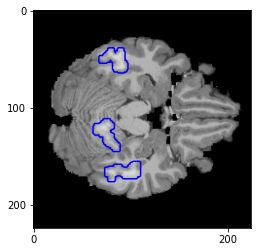

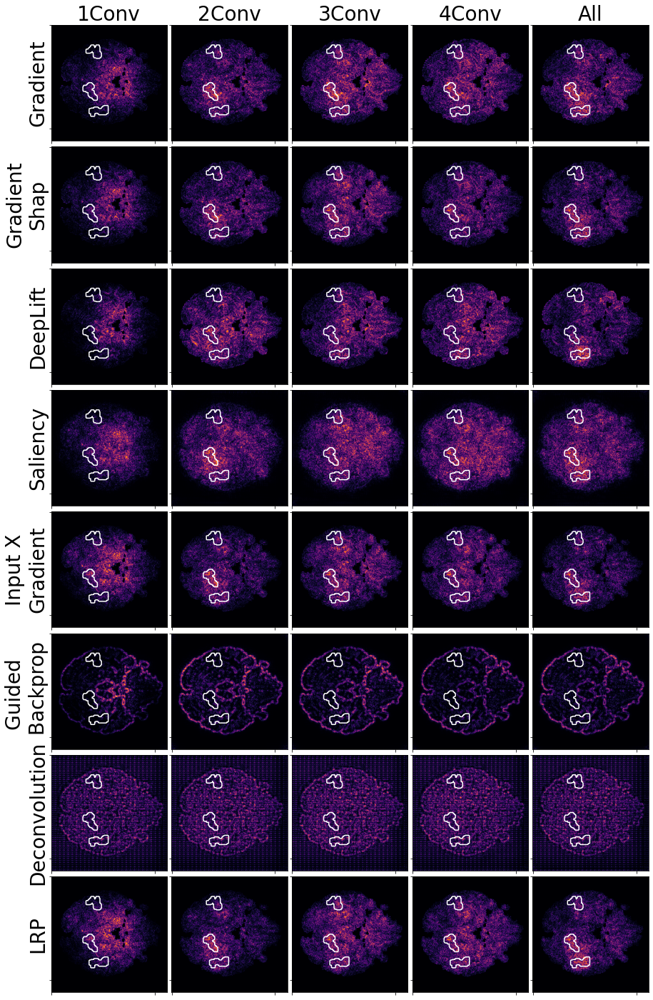

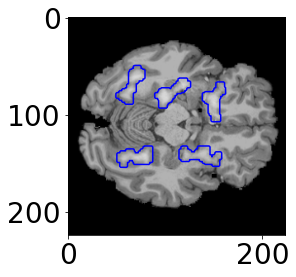

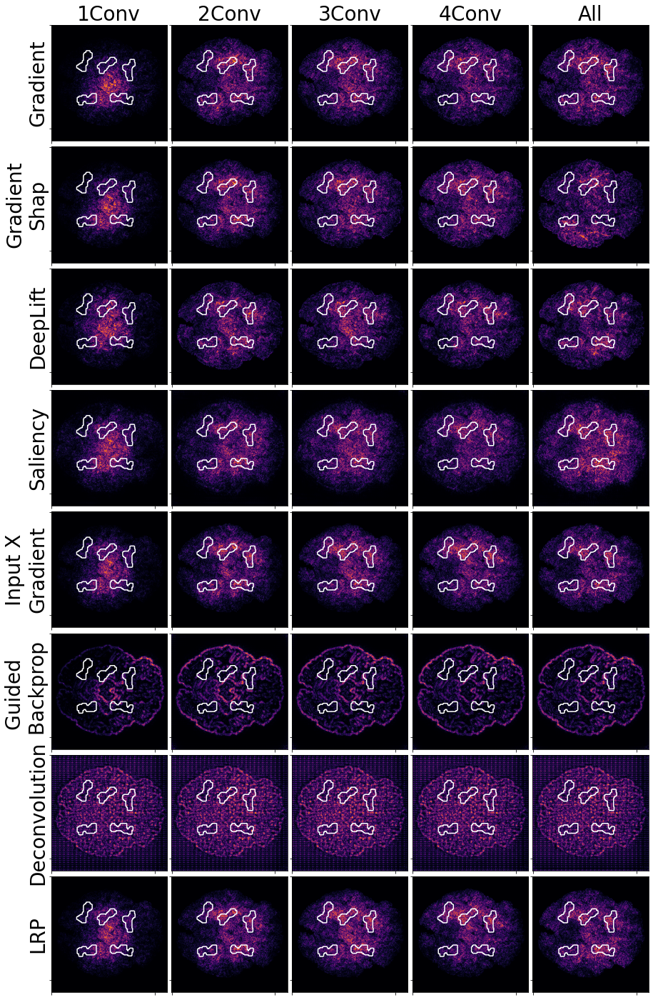

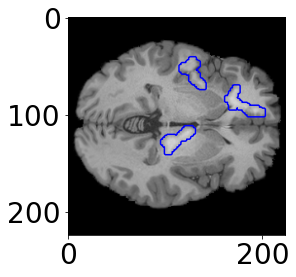

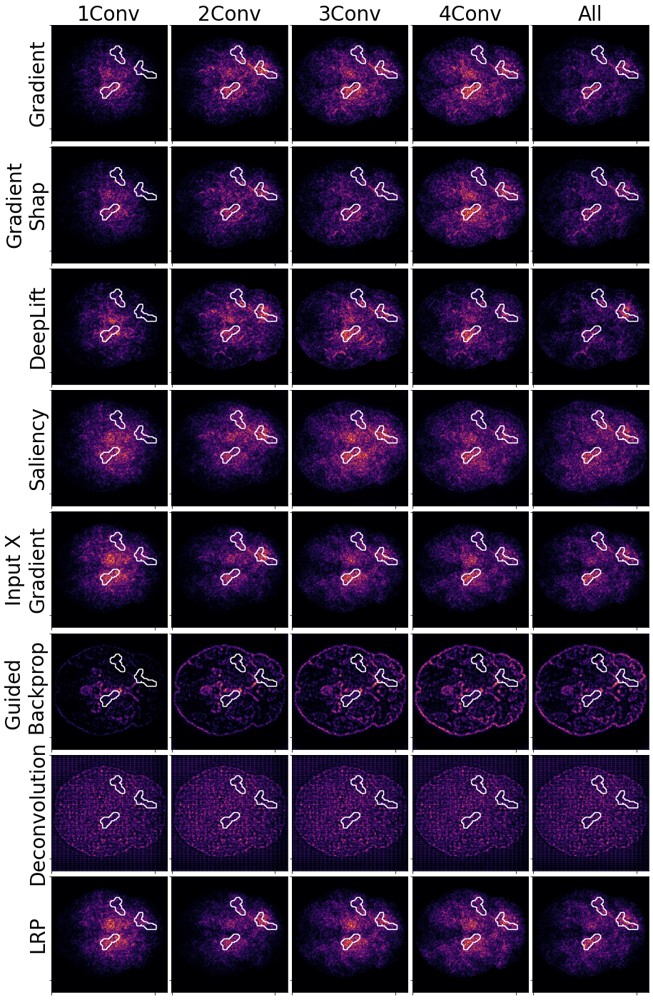

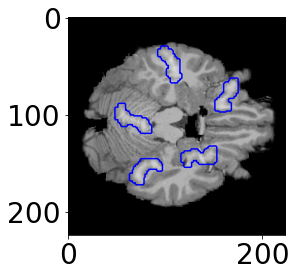

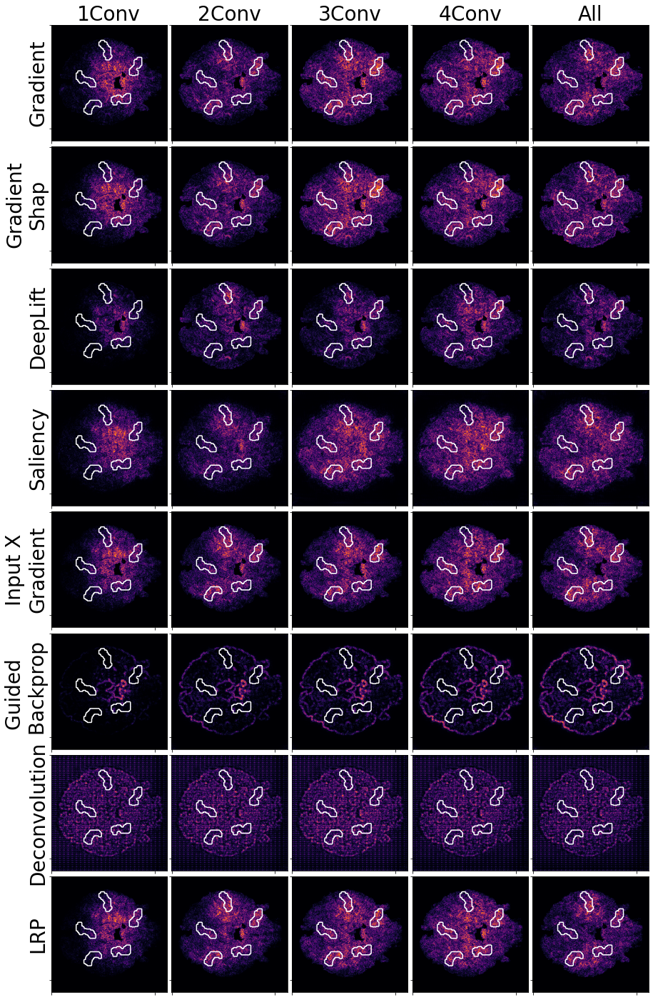

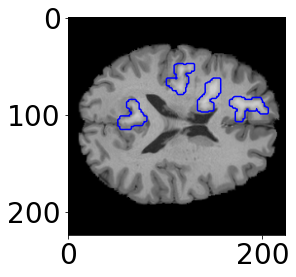

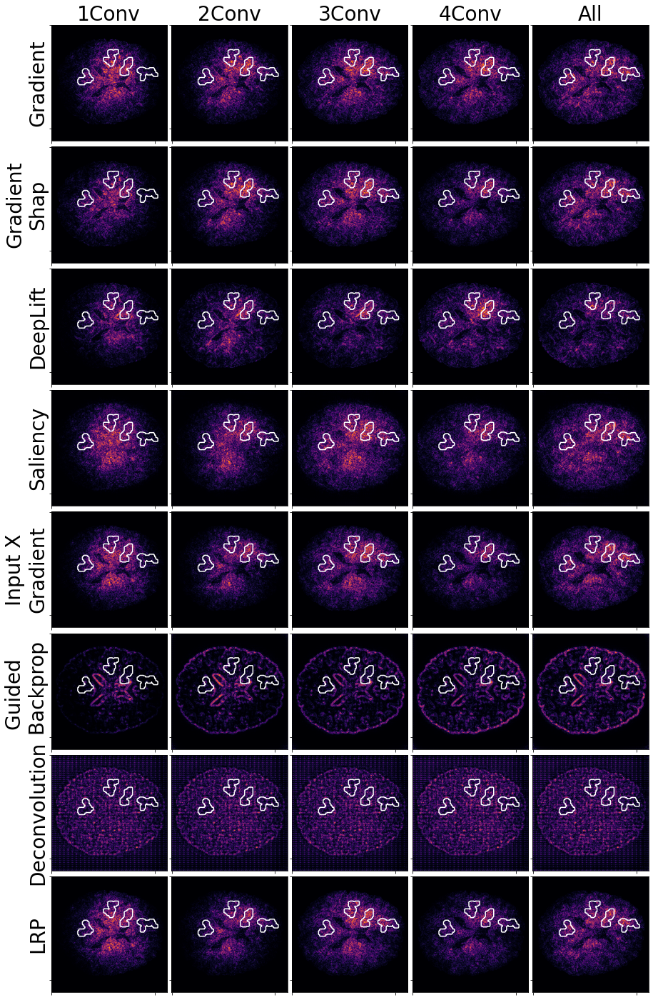

In [13]:

for n in list(heatmap_dict_same.keys()):
    plt.figure()
    plt.imshow(dataset[n][0].transpose(1,2,0))
    plt.contour(resize(ground_truths[n],(224,224)),levels=[1],colors=['blue'])
    create_plot(heatmap_dict_same, n, ground_truths)

### Best Performance

In [8]:
with open('/home/martao/MRI_dataset/2ndTry/Models/VGG/2500/best_acc/saves/incorrectly_classified.pkl', 'rb') as f:
    incorrectly_classified_best = pickle.load(f)
    
print('Model names in incorrectly_classified_best')
list(incorrectly_classified_best.keys())


Model names in incorrectly_classified_best


['new_finetuning_1conv_0.5_img_2500_0.02_18464',
 'new_finetuning_all_0.5_img_2500_0.004_58461',
 'new_finetuning_1conv_0.5_img_2500_0.02_646976',
 'new_finetuning_2conv_0.5_img_2500_0.008_18464876',
 'new_finetuning_4conv_0.5_img_2500_0.008_32323548',
 'new_finetuning_4conv_0.5_img_2500_0.008_116560000',
 'new_finetuning_4conv_0.5_img_2500_0.008_98794515',
 'new_finetuning_3conv_0.5_img_2500_0.008_98794515',
 'new_finetuning_1conv_0.5_img_2500_0.02_23548',
 'new_finetuning_3conv_0.5_img_2500_0.008_55168461',
 'new_finetuning_all_0.5_img_2500_0.004_23548',
 'new_finetuning_2conv_0.5_img_2500_0.008_32323548',
 'new_finetuning_2conv_0.5_img_2500_0.008_116560000',
 'new_finetuning_1conv_0.5_img_2500_0.02_55168461',
 'new_finetuning_2conv_0.5_img_2500_0.008_23548',
 'new_finetuning_all_0.5_img_2500_0.004_55168461',
 'new_finetuning_4conv_0.5_img_2500_0.008_18464876',
 'new_finetuning_4conv_0.5_img_2500_0.008_58461',
 'new_finetuning_3conv_0.5_img_2500_0.008_18464876',
 'new_finetuning_1con

In [12]:
models_to_use_best = ['new_finetuning_1conv_0.5_img_2500_0.02_646976',
                     'new_finetuning_2conv_0.5_img_2500_0.008_18464876',
                      'new_finetuning_3conv_0.5_img_2500_0.008_18464',
                      'new_finetuning_4conv_0.5_img_2500_0.008_32323548',
                      'new_finetuning_all_0.5_img_2500_0.004_116560000']

selected_images_idxs = get_indexes_in_common(models_to_use_best,incorrectly_classified_best)
print(selected_images_idxs)

input_dict = {'model': models_to_use_best,
             'index': selected_images_idxs,
             'block': ['1conv','2conv','3conv','4conv','all']}

folder = '/home/martao/MRI_dataset/2ndTry/Models/VGG/2500/best_acc/done/'
device = 'cuda:4'

heatmap_dict_best = obtain_heatmap_dict(input_dict, folder, device)


13
[6514, 6267, 6597, 7758, 3446]

###############################################
	 Image index number 6514
###############################################
		 ----------
new_finetuning_1conv_0.5_img_2500_0.02_646976
loading model...
obtaining explanations...


/home/martao/anaconda3/lib/python3.9/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/martao/anaconda3/lib/python3.9/site-packages/captum/attr/_core/deep_lift.py:336: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
/home/martao/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:749: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/home/martao/anaconda3/lib/python3.9/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed 

adding explanations to dict...
		 ----------
new_finetuning_2conv_0.5_img_2500_0.008_18464876
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_3conv_0.5_img_2500_0.008_18464
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_4conv_0.5_img_2500_0.008_32323548
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_all_0.5_img_2500_0.004_116560000
loading model...
obtaining explanations...
adding explanations to dict...

###############################################
	 Image index number 6267
###############################################
		 ----------
new_finetuning_1conv_0.5_img_2500_0.02_646976
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_2conv_0.5_img_2500_0.008_18464876
loading model...
obtaining explanations...
adding explanations to dict...
		 ----------
new_finetuning_3c

NameError: name 'heatmap_dict_same' is not defined

In [13]:

with open(folder[:-5]+'/saves/heatmap_dict.pkl', 'wb') as f:
     pickle.dump(heatmap_dict_best,f)

/tmp/ipykernel_3655240/1518352837.py:4: UserWarning: No contour levels were found within the data range.
  plt.contour(resize(ground_truths[n],(224,224)),levels=[1],colors=['blue'])
/tmp/ipykernel_3655240/3077539831.py:34: UserWarning: No contour levels were found within the data range.
  axs[j, i].contour(resize(input_gt[image_index],(224,224)),levels=[1],colors=['white'])


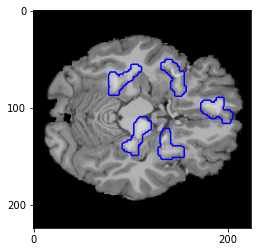

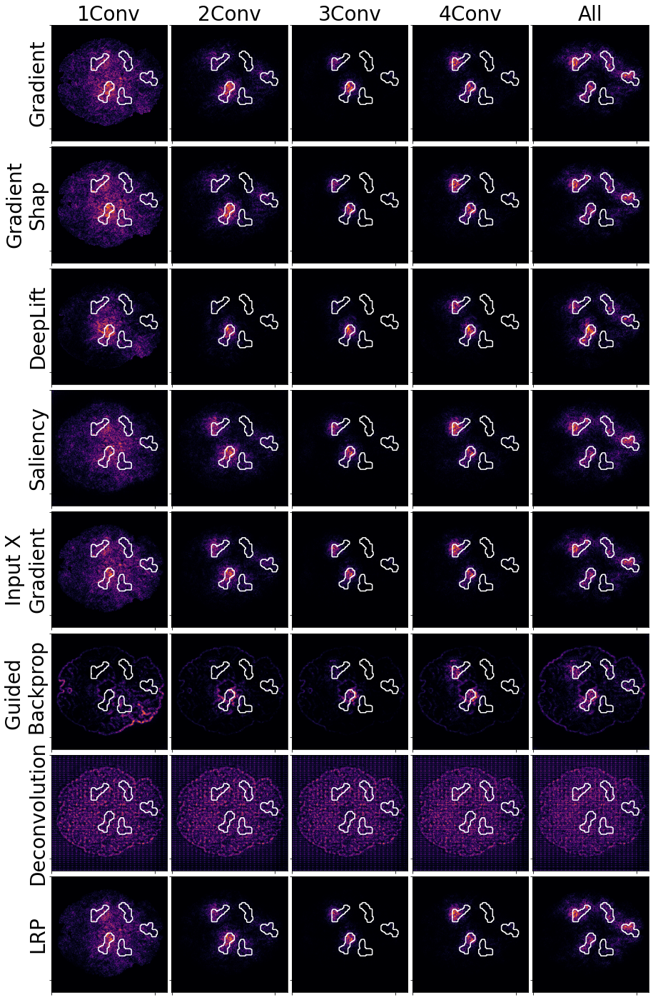

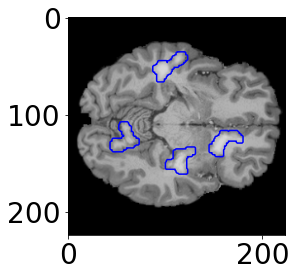

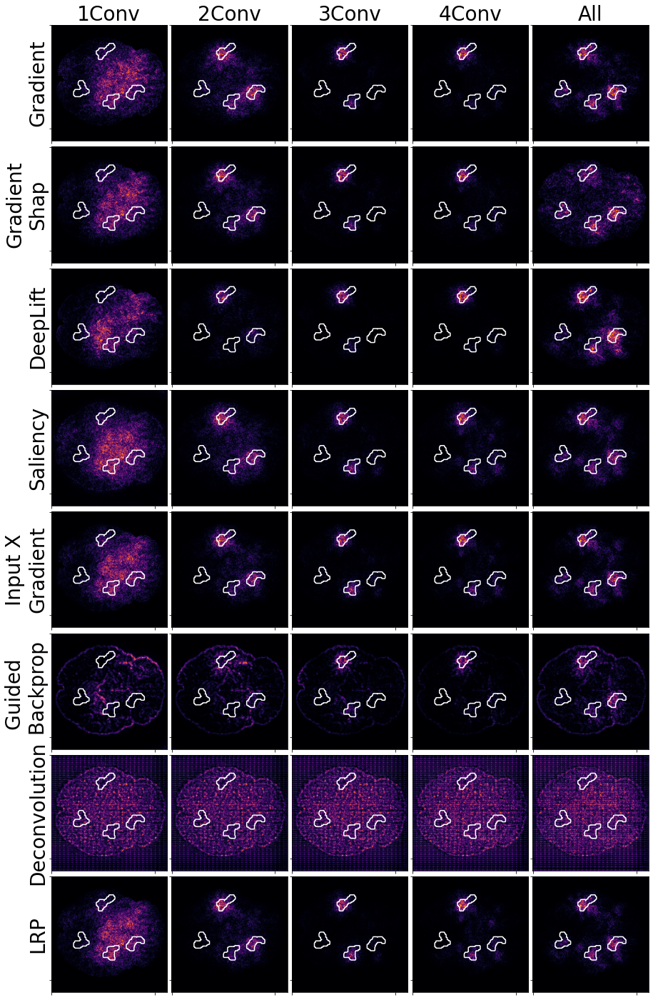

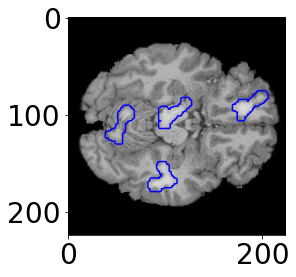

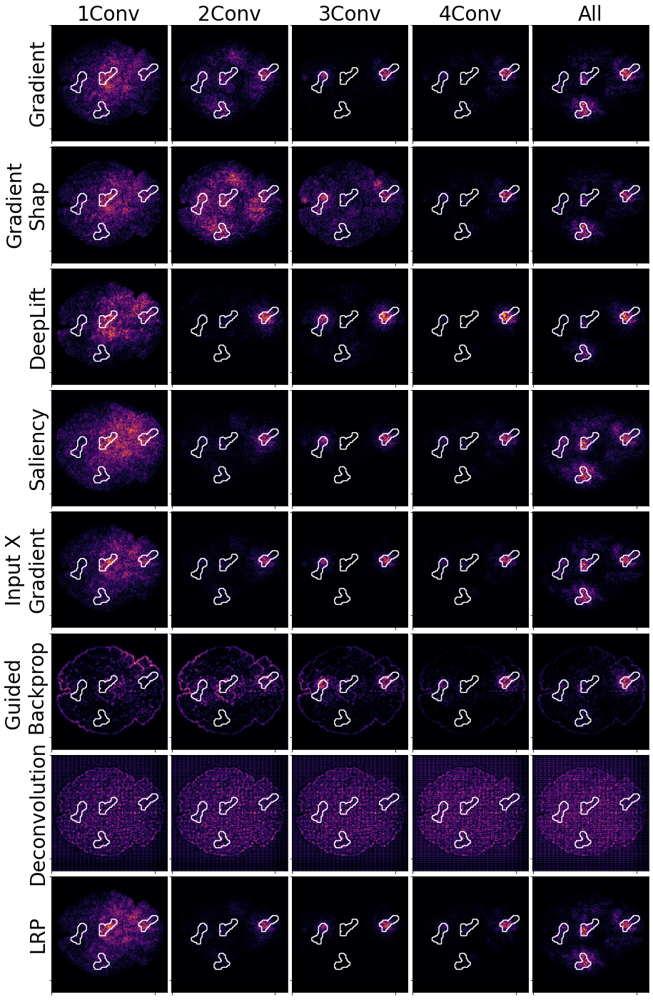

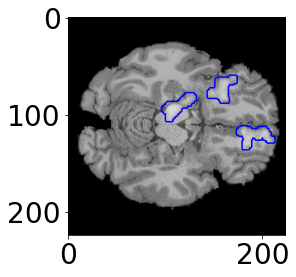

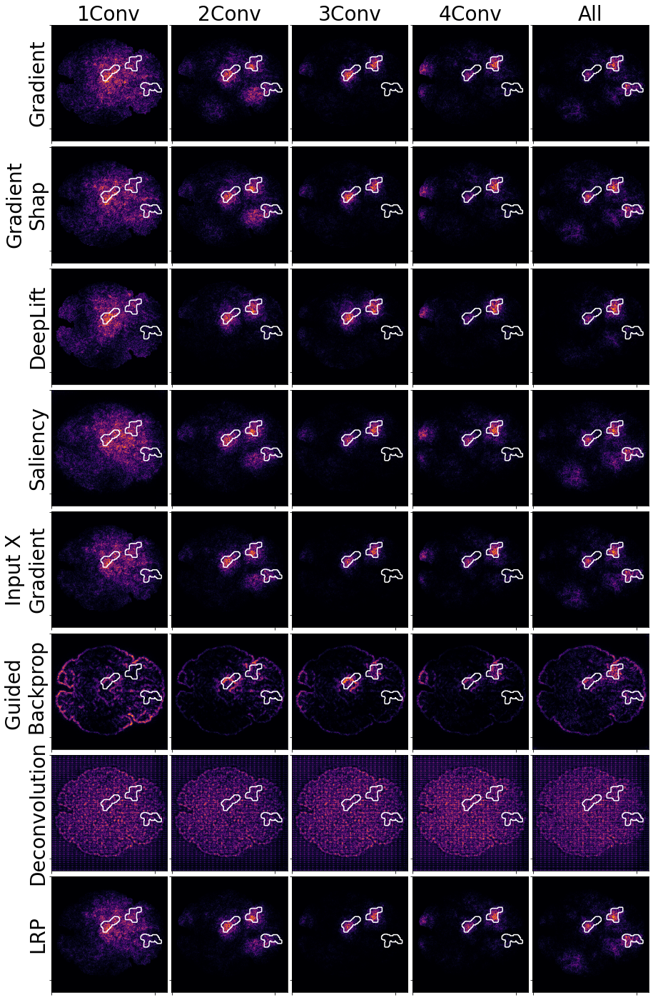

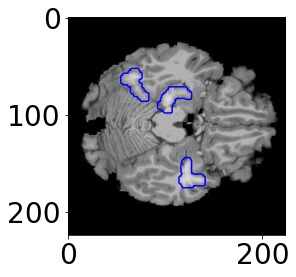

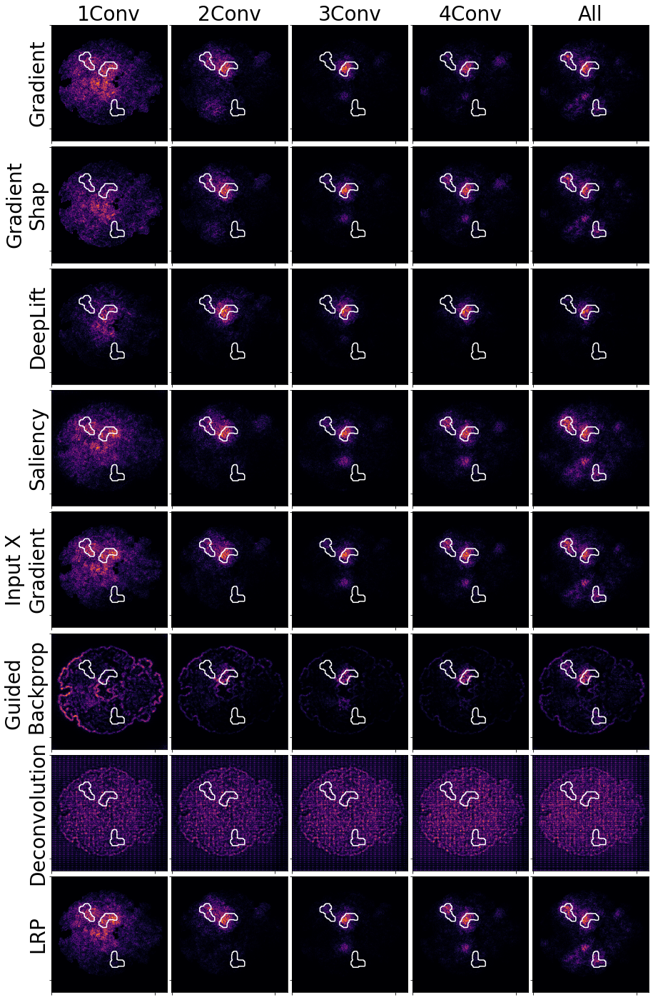

In [14]:

for n in list(heatmap_dict_best.keys()):
    plt.figure()
    plt.imshow(dataset[n][0].transpose(1,2,0))
    plt.contour(resize(ground_truths[n],(224,224)),levels=[1],colors=['blue'])
    create_plot(heatmap_dict_best, n, ground_truths)